# Color Spaces

- image channels
- manipulate color space
- HSV color space

---
### Imports & Helper-functions

In [30]:
import os
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt

In [75]:
def imshow(img, title=None, size=10, axis=False, color_space="BGR"):
    aspect_ratio = img.shape[0] / img.shape[1]
    plt.figure(figsize=(size * aspect_ratio, size))
    if color_space.lower() == "bgr":
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    elif color_space.lower() == "rgb":
        rgb_img = img
    else:
        rgb_img = cv2.cvtColor(img, cv2.COLOR_HSV2RGB)
    plt.imshow(rgb_img)
    if type(title) == str:
        plt.title(title)
    if axis ==False:
        plt.axis('off')
    plt.show()

In [32]:
def get_random_img_path(search_path='../../res/img'):
    """
    This function searches for common image files in all subdirectories
    and return a random image path of them.
    """
    image_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff', '.ico']
    image_paths = []

    # Walk through all subdirectories
    for root, dirs, files in os.walk(search_path):
        for file_name in files:
            # Check if the file is an image
            if any(file_name.lower().endswith(ext) for ext in image_extensions):
                # Get the full file path
                full_path = os.path.join(root, file_name).replace("\\", "/")
                image_paths.append(full_path)

    return random.choice(image_paths)

# test
get_random_img_path()    

'../../res/img/flickr30k_images/flickr30k_images/3414734842.jpg'

---
### Loading the data

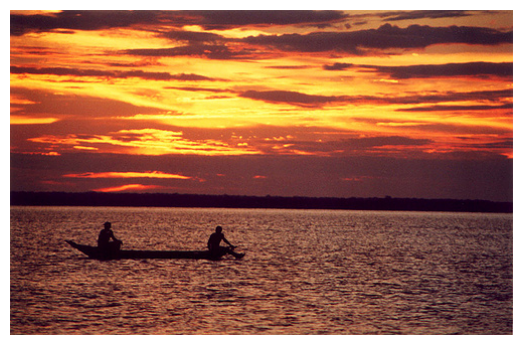

In [33]:
img = cv2.imread(get_random_img_path())

imshow(img)

---
### Color Channels

cv2 uses Blue, Green, Red (BGR)

matplotlib uses Res, Green, Blue (RGB)

using indedxing

In [39]:
img.shape

(324, 500, 3)

In [41]:
B, G, R = img[:, :, 0], img[:, :, 1], img[:, :, 2]

print(B.shape)
print(G.shape)
print(R.shape)

(324, 500)
(324, 500)
(324, 500)


using split method

In [57]:
B, G, R = cv2.split(img)

print(B.shape)
print(G.shape)
print(R.shape)

(324, 500)
(324, 500)
(324, 500)


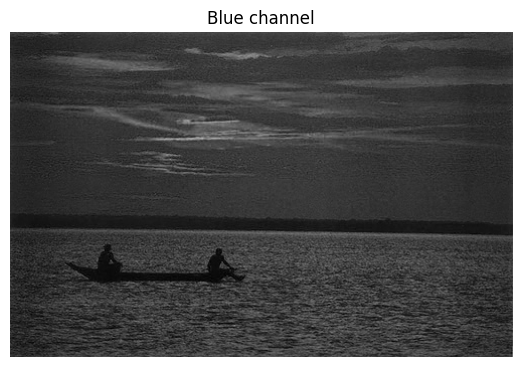

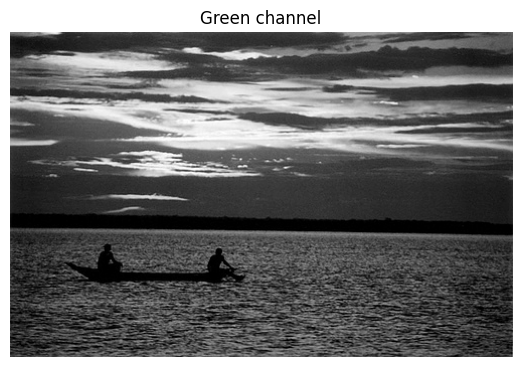

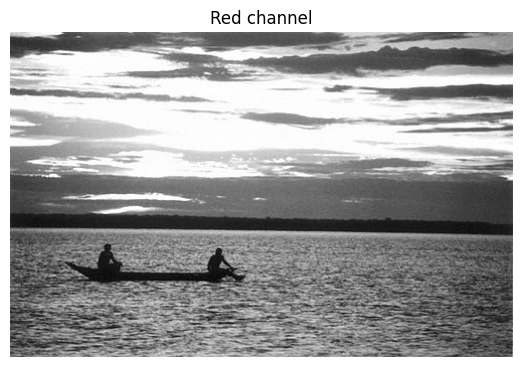

In [58]:
imshow(B, title="Blue channel")
imshow(G, title="Green channel")
imshow(R, title="Red channel")

Only show one channel in color

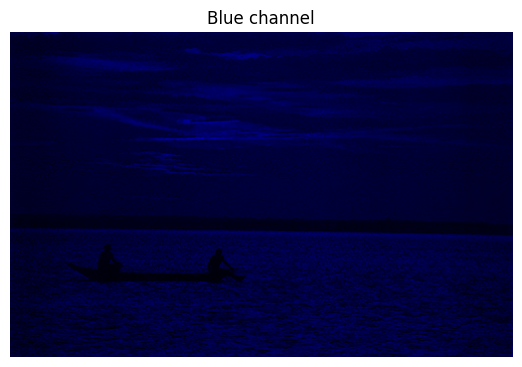

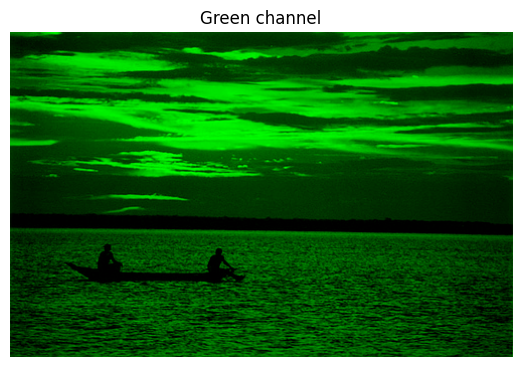

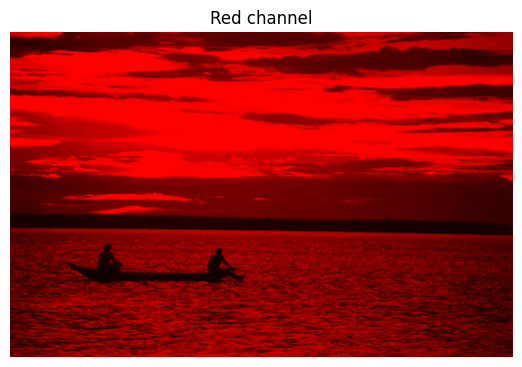

In [60]:
zeros = np.zeros(img.shape[:2], dtype="uint8")
blue_img = cv2.merge([B, zeros, zeros])
green_img = cv2.merge([zeros, G, zeros])
red_img = cv2.merge([zeros, zeros, R])

imshow(blue_img, title="Blue channel")
imshow(green_img, title="Green channel")
imshow(red_img, title="Red channel")

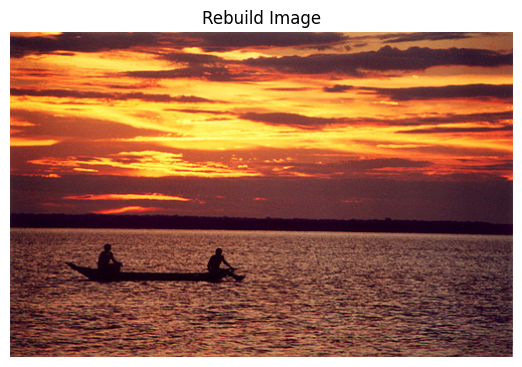

In [61]:
imshow(cv2.merge([B, G, R]), title="Rebuild Image")

Use **cv2.split** method to get the channels. Use **cv2.merge** to create an image from B, G, R channels.

---
### Manipulate colorspace

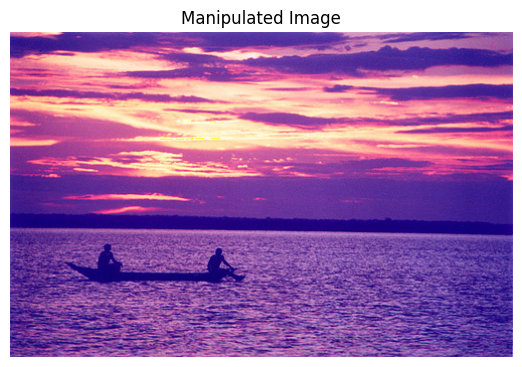

In [68]:
imshow(cv2.merge([B+100, G, R]), title="Manipulated Image")

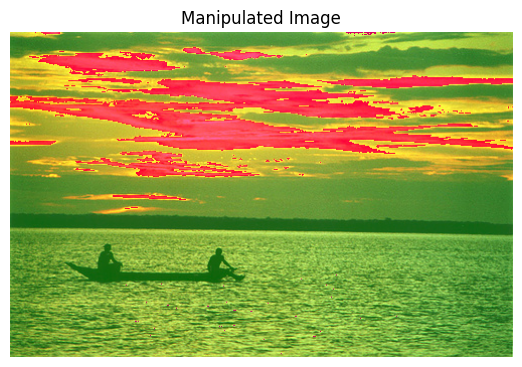

In [69]:
imshow(cv2.merge([B, G+100, R]), title="Manipulated Image")

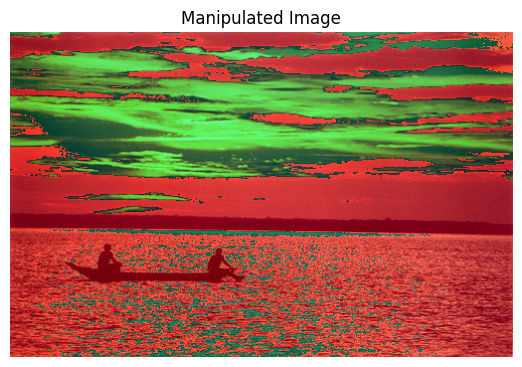

In [70]:
imshow(cv2.merge([B, G, R+100]), title="Manipulated Image")

---
### HSV Color Space

- **Hue**: Color (Blue, Green, ...), 0-179
- **Saturation**: Brightness, 0-255
- **Value**: Darkness, 0-255

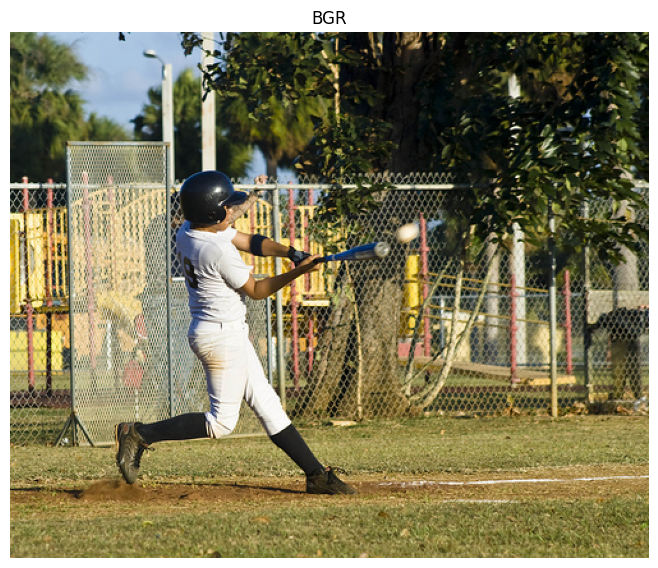

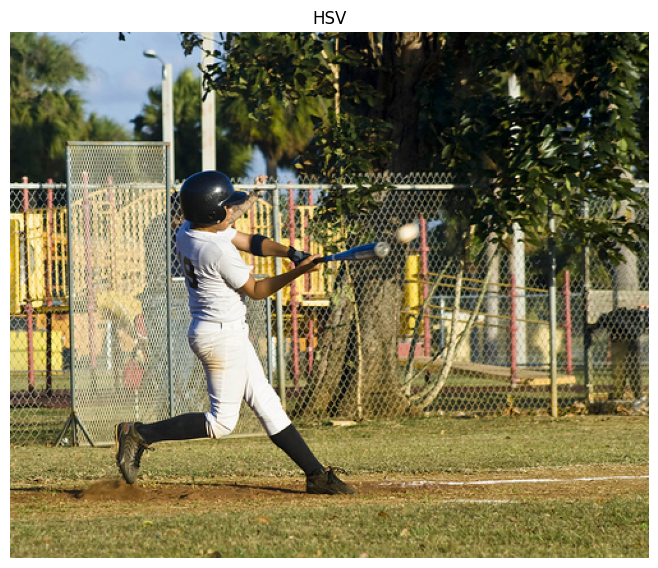

In [78]:
img = cv2.imread(get_random_img_path())

hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
imshow(img, "BGR")
imshow(hsv_img, "HSV", color_space="HSV")

In [79]:
hsv_img

array([[[ 37, 114, 125],
        [ 38, 112, 125],
        [ 40, 114, 116],
        ...,
        [ 35, 167, 127],
        [ 36, 204, 111],
        [ 38, 215,  51]],

       [[ 38, 113, 115],
        [ 38, 120, 108],
        [ 40, 125, 100],
        ...,
        [ 33, 126, 146],
        [ 33, 154, 137],
        [ 34, 161,  81]],

       [[ 42, 104, 108],
        [ 41, 122,  94],
        [ 41, 132,  87],
        ...,
        [ 35, 155, 122],
        [ 35, 150,  90],
        [ 38,  62,  62]],

       ...,

       [[ 24, 141, 127],
        [ 23, 140, 133],
        [ 23, 113, 165],
        ...,
        [ 27, 147, 135],
        [ 27, 146, 131],
        [ 28, 144, 129]],

       [[ 23, 158, 136],
        [ 22, 147, 142],
        [ 22, 132, 158],
        ...,
        [ 27, 131, 156],
        [ 27, 174, 116],
        [ 27, 174, 113]],

       [[ 22, 139, 169],
        [ 22, 137, 169],
        [ 22, 139, 158],
        ...,
        [ 27, 132, 155],
        [ 27, 150, 136],
        [ 27, 141, 139]]

channels of HSV

In [80]:
hsv_img.shape

(412, 500, 3)

In [81]:
H, S, V = cv2.split(hsv_img)
# H, S, V = hsv_img[:, :, 0], hsv_img[:, :, 1], hsv_img[:, :, 2]

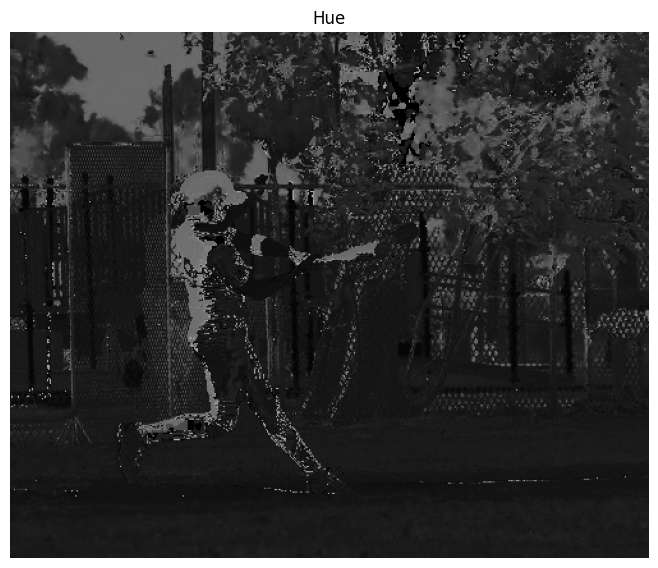

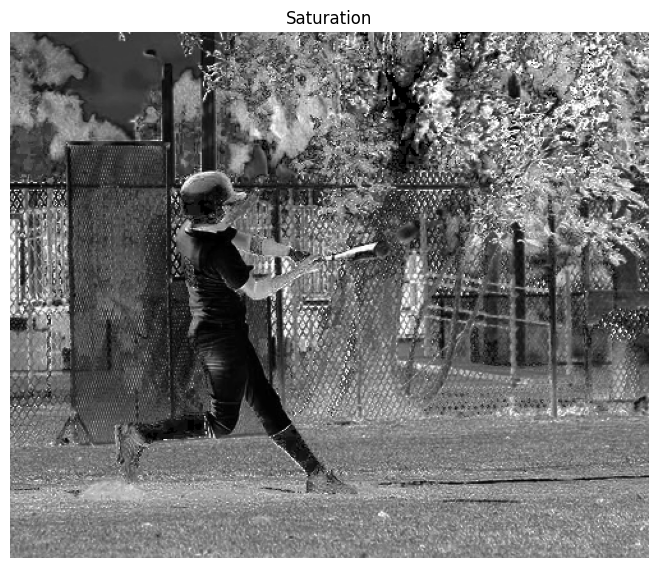

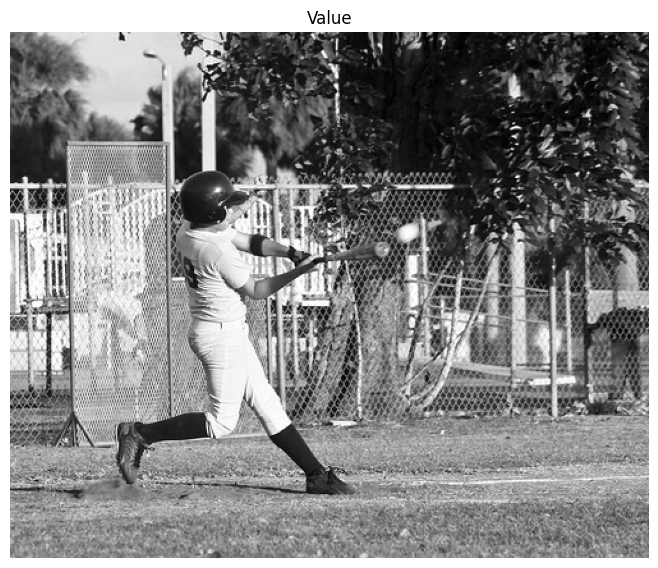

In [82]:
imshow(H, "Hue")
imshow(S, "Saturation")
imshow(V, "Value")

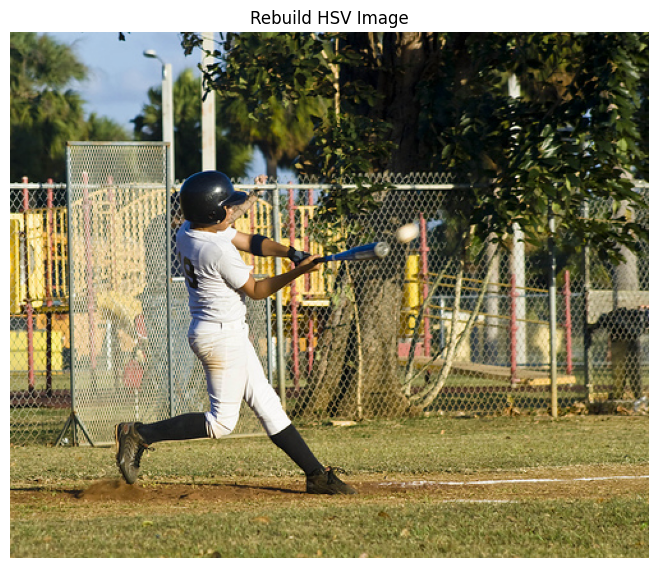

In [83]:
imshow(cv2.merge([H, S, V]), title="Rebuild HSV Image", color_space="HSV")

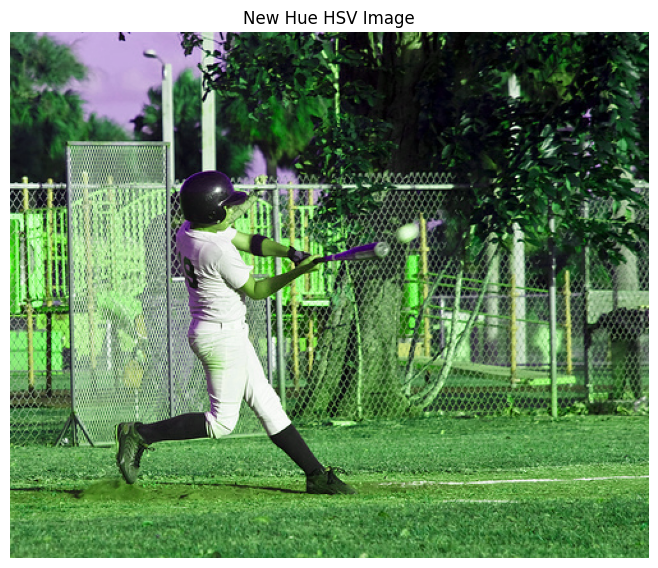

In [84]:
imshow(cv2.merge([H+30, S, V]), title="New Hue HSV Image", color_space="HSV")

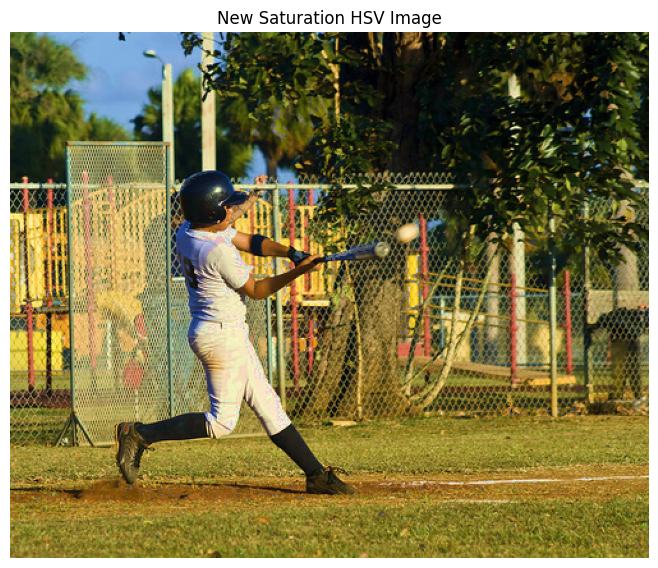

In [85]:
imshow(cv2.merge([H, S+50, V]), title="New Saturation HSV Image", color_space="HSV")

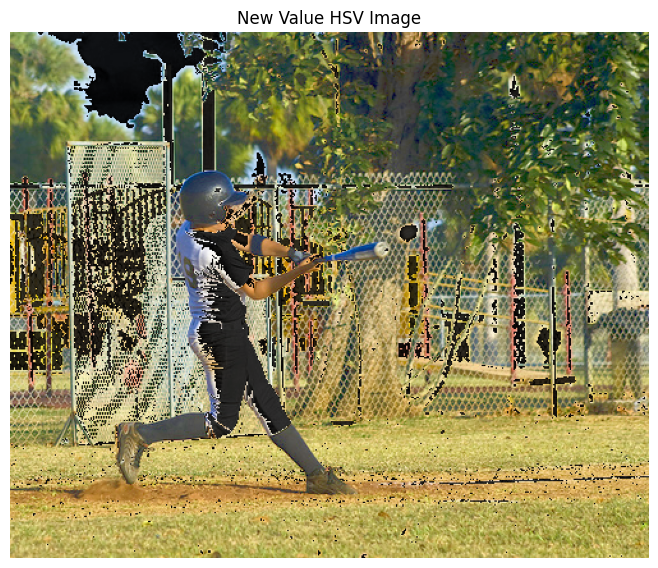

In [90]:
imshow(cv2.merge([H, S, V+50]), title="New Value HSV Image", color_space="HSV")

---